#Quantification of rat behavior using unsupervised learning

In [ ]:
!pip install mat73

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
path = "/content/drive/MyDrive/structureRWRich.mat"

import mat73
data_dict = mat73.loadmat(path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).




#Part 1:   Spike time position relative to rat’s position 
#Part 2:   Probability of spikes as a function of direction


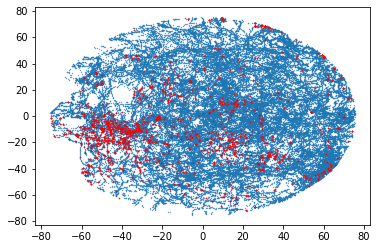

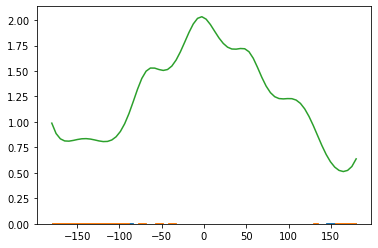

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
import scipy.stats as stats
str_dict = data_dict["STR"]

#Getting the position data for expt 0
def make_position_plot(expt_no, neuron_no):
  position = str_dict["Position"]
  position_0 = position[expt_no]

  position_x = [i[0] for i in position_0]
  position_y = [i[1] for i in position_0]

  time = str_dict["Time"]
  time_0 = time[expt_no]

  uid = str_dict["UID"]
  activation_times_0 = uid[expt_no]['ST'][neuron_no]

  start_clip_index = 0
  end_clip_index = len(activation_times_0)-1
  while (activation_times_0[start_clip_index] < time_0[0]):
    start_clip_index +=1
  while (activation_times_0[end_clip_index] > time_0 [-1] ):
    end_clip_index -=1

  activation_times_0 = activation_times_0[start_clip_index : end_clip_index+1]
  active_arr_index = 0
  time_index = 1
  position_x_spike = []
  position_y_spike = []
  while time_index < len(time_0):
    if (time_0[time_index-1] <= activation_times_0[active_arr_index] <= time_0[time_index]):
      position_x_spike.append((position_0[time_index-1][0] + position_0[time_index][0])/2.0)
      position_y_spike.append((position_0[time_index-1][1] + position_0[time_index][1])/2.0)
      active_arr_index+=1
      if (active_arr_index == len(activation_times_0)):
        break
    else:
      time_index +=1

  plt.scatter(position_x, position_y, s = 0.1)
  plt.scatter(position_x_spike, position_y_spike, c="red", s=0.4)
  plt.show()

#Getting the direction data for expt 0
def make_direction_plot(expt_no, neuron_no):
  direction = str_dict["Direction"]
  direction_0 = direction[expt_no]

  time = str_dict["Time"]
  time_0 = time[expt_no]

  drop_ind = ~np.isnan(direction_0)
  direction_0 = direction_0[drop_ind]
  time_0 = time_0[drop_ind]

  uid = str_dict["UID"]
  activation_times_0 = uid[expt_no]['ST'][neuron_no]
  start_clip_index = 0
  end_clip_index = len(activation_times_0)-1
  while (activation_times_0[start_clip_index] < time_0[0]):
    start_clip_index +=1
  while (activation_times_0[end_clip_index] > time_0 [-1] ):
    end_clip_index -=1

  activation_times_0 = activation_times_0[start_clip_index : end_clip_index+1]
  active_arr_index = 0
  time_index = 1
  direction_spike = []
  while time_index < len(time_0):
    if (time_0[time_index-1] <= activation_times_0[active_arr_index] <= time_0[time_index]):
      direction_spike.append((direction_0[time_index-1] + direction_0[time_index])/2.0)
      active_arr_index+=1
      if (active_arr_index == len(activation_times_0)):
        break
    else:
      time_index +=1

  direction_0_ang = direction_0*180/np.pi
  direction_spike_ang = np.array(direction_spike)*180/np.pi

  density_0 = stats.gaussian_kde(direction_0_ang)
  n, hist_0, _ = plt.hist(direction_0_ang, bins=np.linspace(-180, 180, 72), histtype=u'step', density=True)  

  density_spike = stats.gaussian_kde(direction_spike_ang)
  n, hist_spike, _ = plt.hist(direction_spike_ang, bins=np.linspace(-180, 180, 72), histtype=u'step', density=True)  
  plt.plot(hist_spike, density_spike(hist_spike)/density_0(hist_0))
  plt.show()


make_position_plot(expt_no = 0,neuron_no = 0)
make_direction_plot(expt_no = 0, neuron_no =0)


Neuron :  0


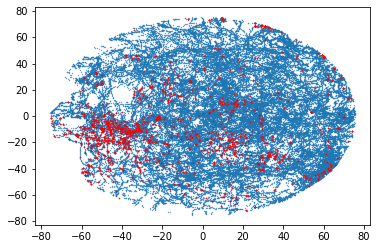

Neuron :  1


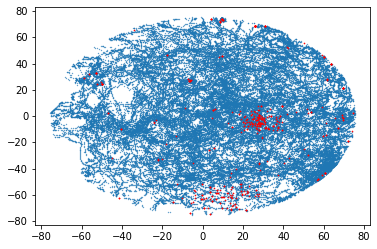

Neuron :  2


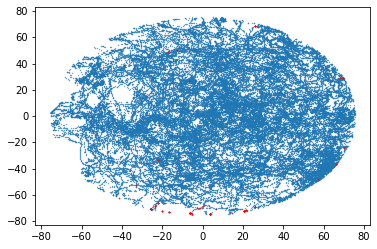

Neuron :  3


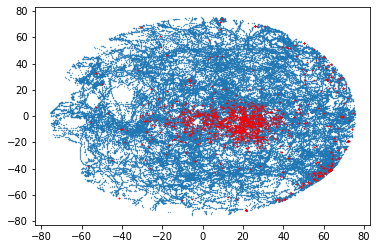

Neuron :  4


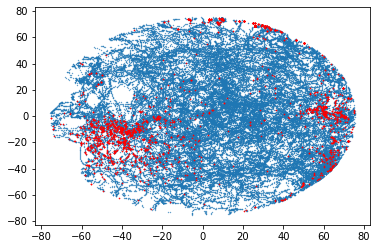

Neuron :  5


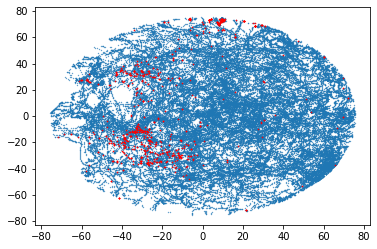

Neuron :  6


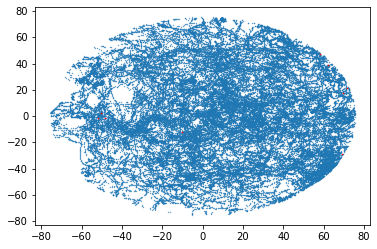

Neuron :  7


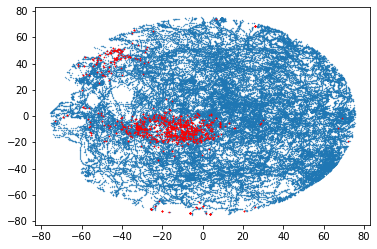

Neuron :  8


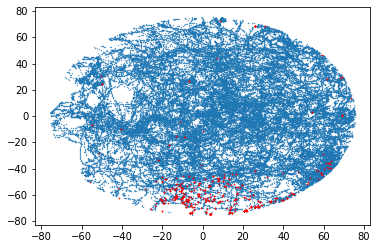

Neuron :  9


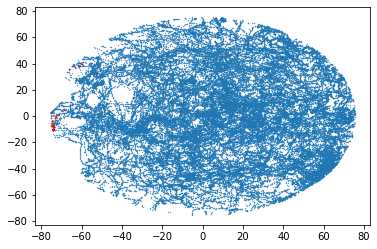

Neuron :  10


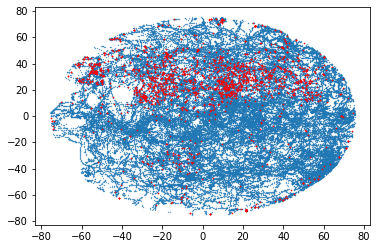

Neuron :  11


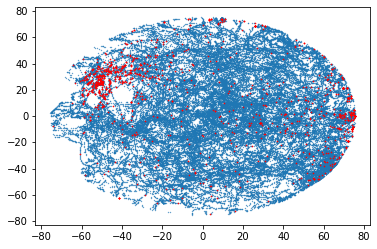

Neuron :  12


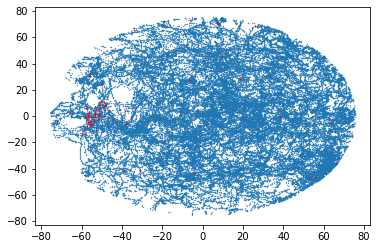

Neuron :  13


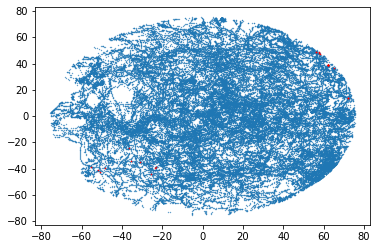

Neuron :  14


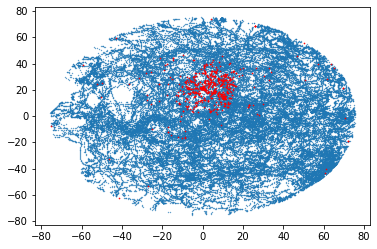

Neuron :  15


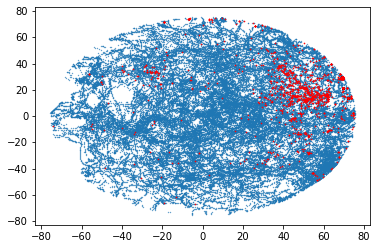

Neuron :  16


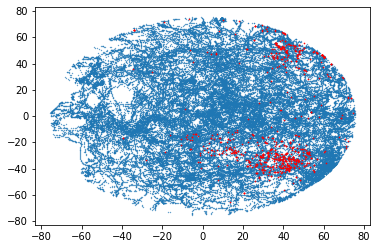

Neuron :  17


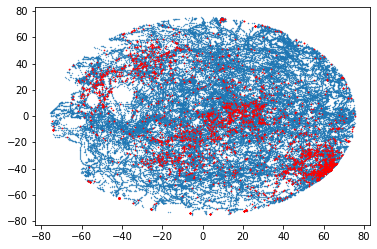

Neuron :  18


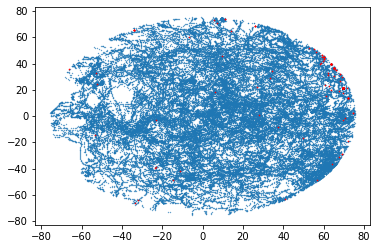

Neuron :  19


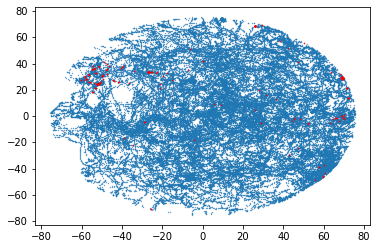

Neuron :  20


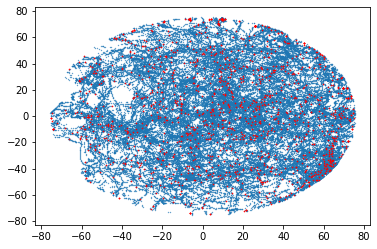

Neuron :  21


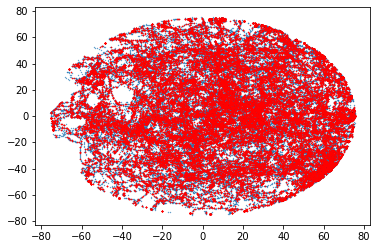

Neuron :  22


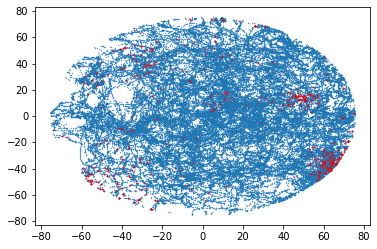

Neuron :  23


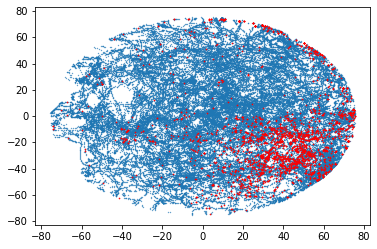

Neuron :  24


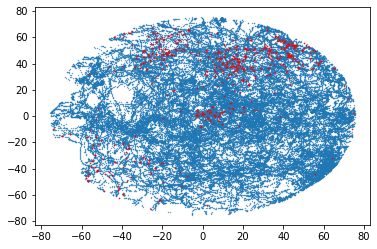

Neuron :  25


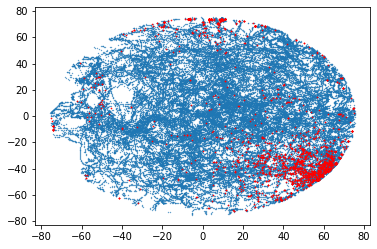

Neuron :  26


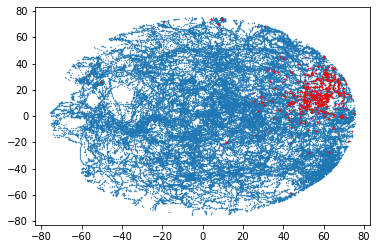

Neuron :  27


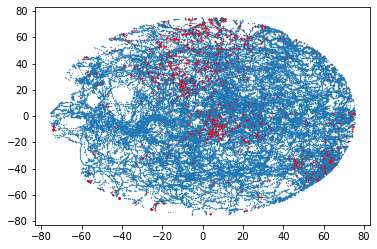

Neuron :  28


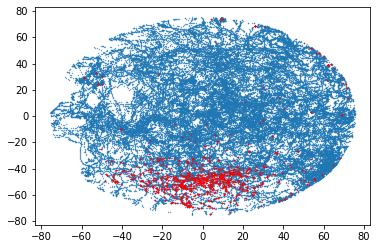

Neuron :  29


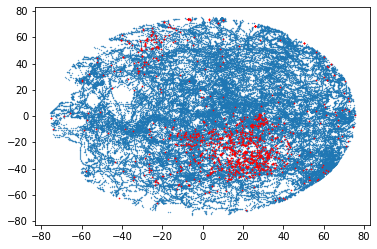

Neuron :  30


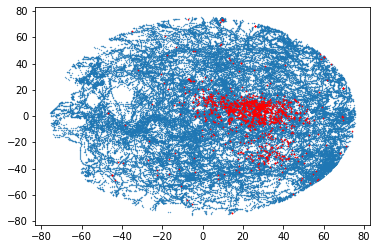

Neuron :  31


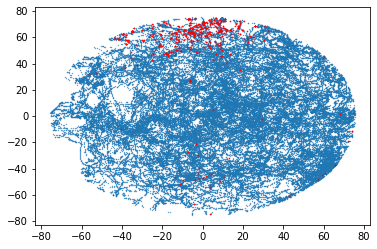

Neuron :  32


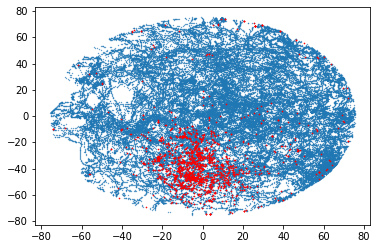

Neuron :  33


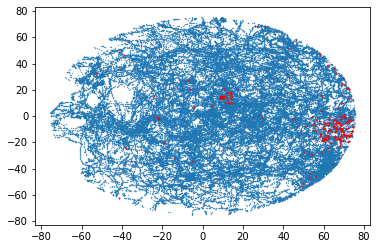

Neuron :  34


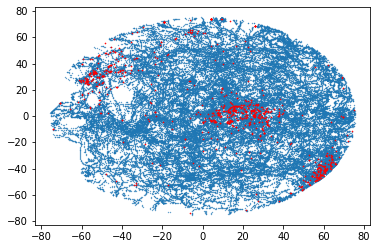

Neuron :  35


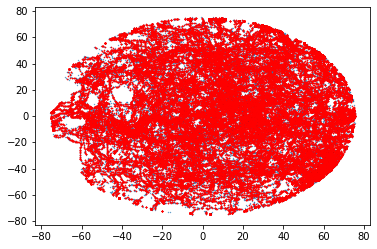

Neuron :  36


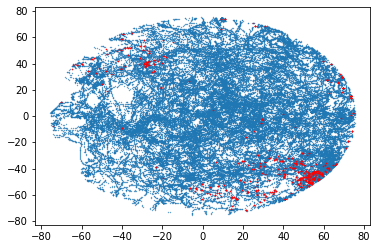

Neuron :  37


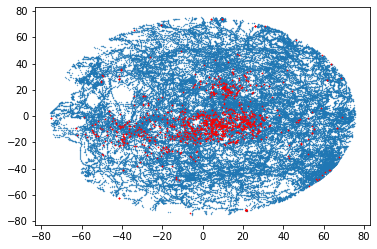

Neuron :  38


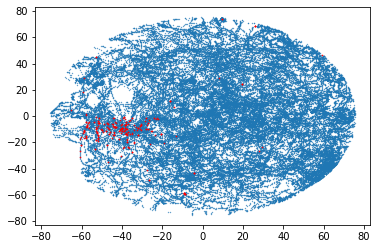

Neuron :  39


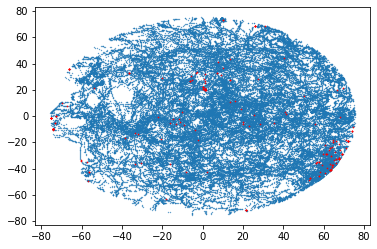

Neuron :  40


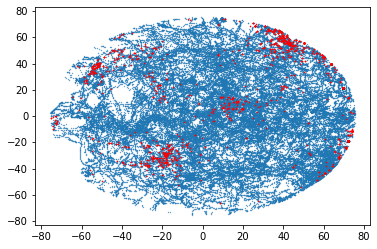

Neuron :  41


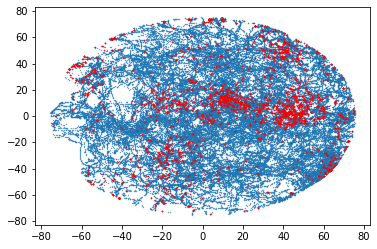

Neuron :  42


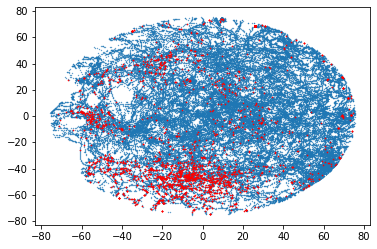

Neuron :  43


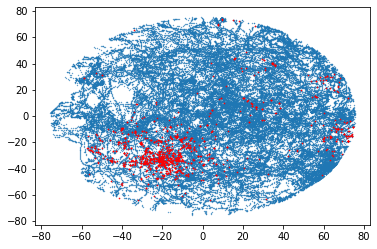

Neuron :  44


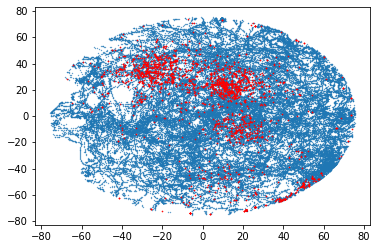

Neuron :  45


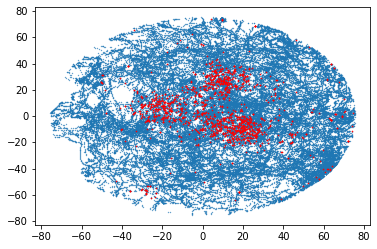

Neuron :  46


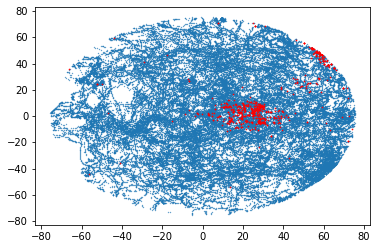

Neuron :  47


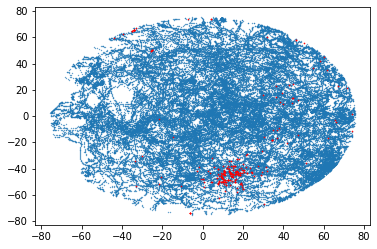

Neuron :  48


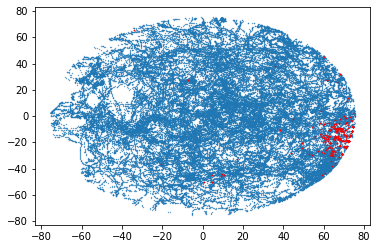

Neuron :  49


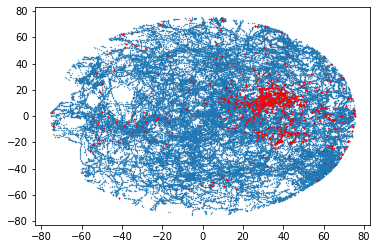

Neuron :  50


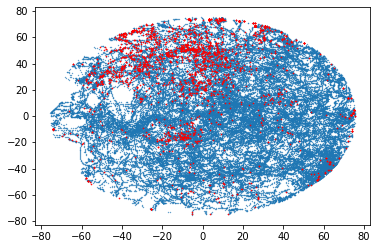

In [ ]:
for neuron_num in range(51):
  print ("Neuron : ", neuron_num)
  make_position_plot(0,neuron_num)

Neuron:  0


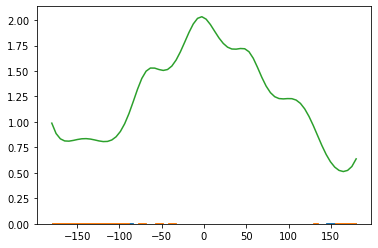

Neuron:  1


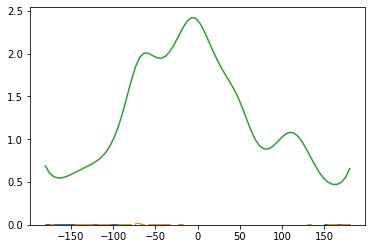

Neuron:  2


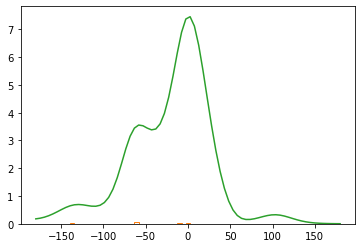

Neuron:  3


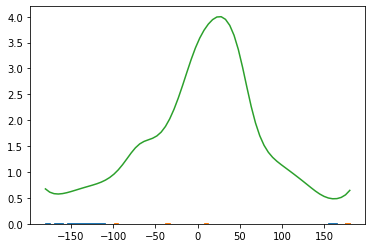

Neuron:  4


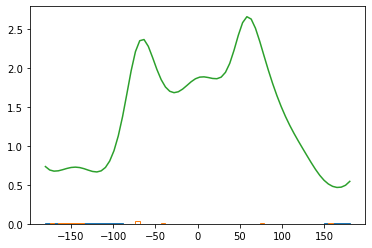

Neuron:  5


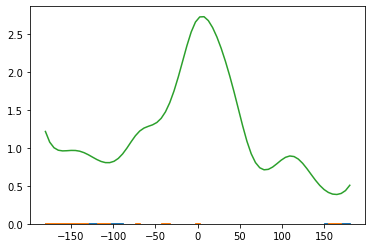

Neuron:  6


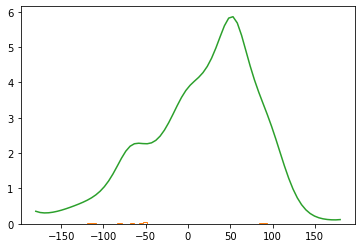

Neuron:  7


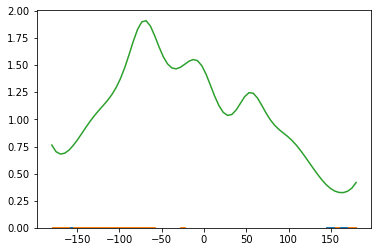

Neuron:  8


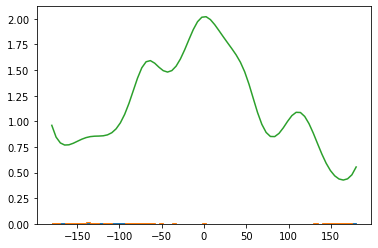

Neuron:  9


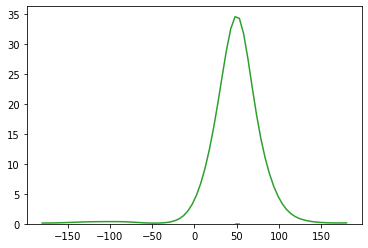

Neuron:  10


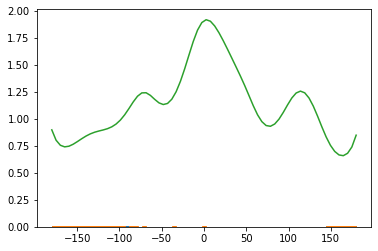

Neuron:  11


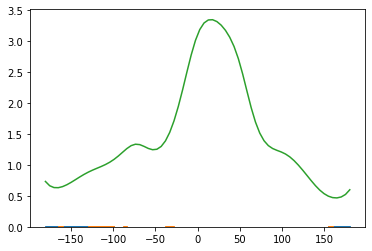

Neuron:  12


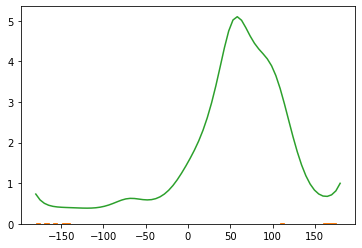

Neuron:  13


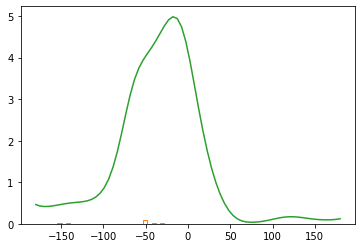

Neuron:  14


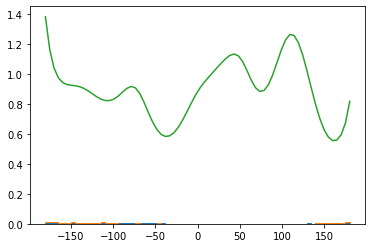

Neuron:  15


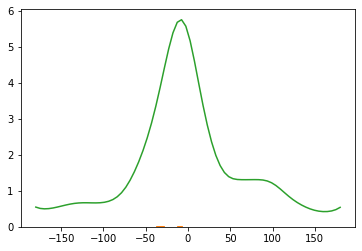

Neuron:  16


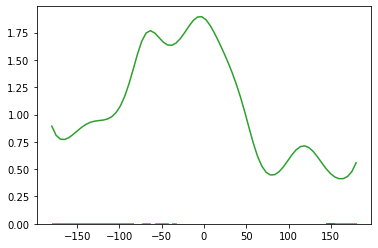

Neuron:  17


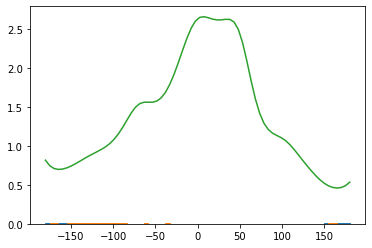

Neuron:  18


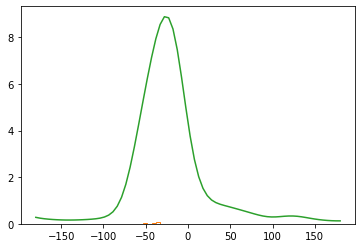

Neuron:  19


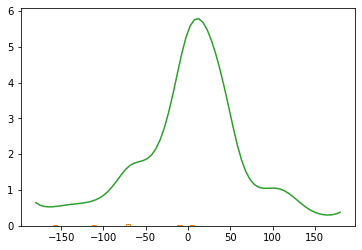

Neuron:  20


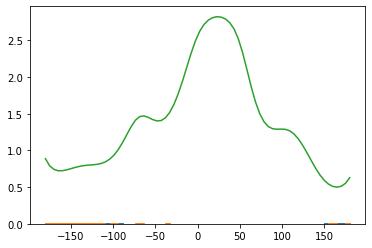

Neuron:  21


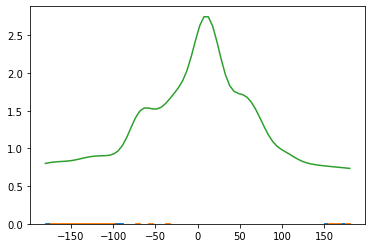

Neuron:  22


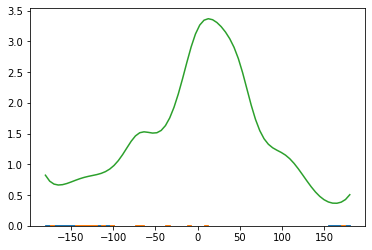

Neuron:  23


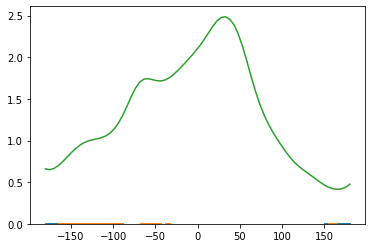

Neuron:  24


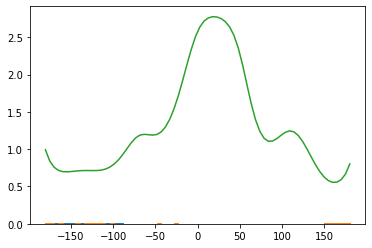

Neuron:  25


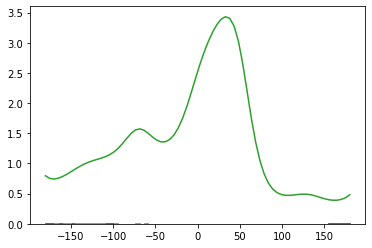

Neuron:  26


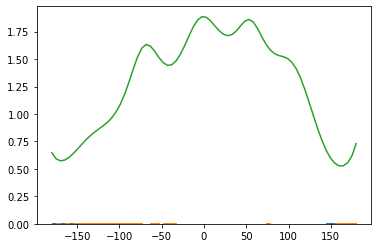

Neuron:  27


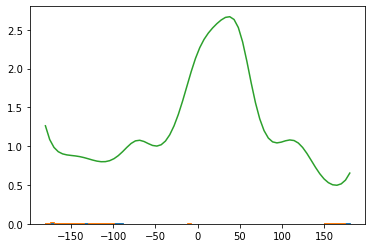

Neuron:  28


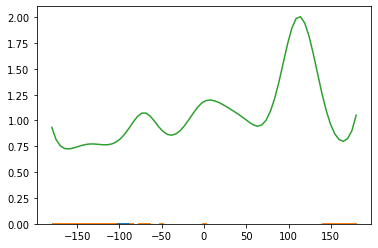

Neuron:  29


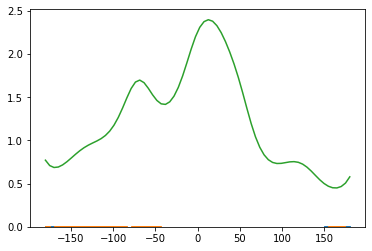

Neuron:  30


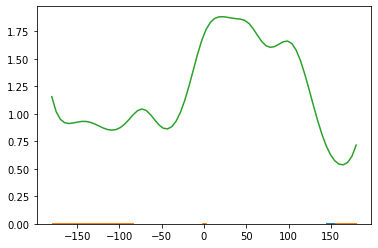

Neuron:  31


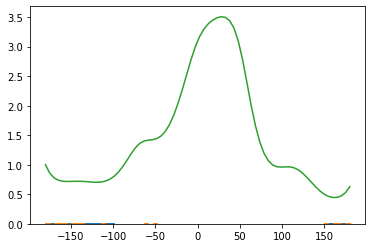

Neuron:  32


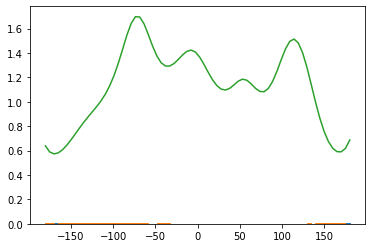

Neuron:  33


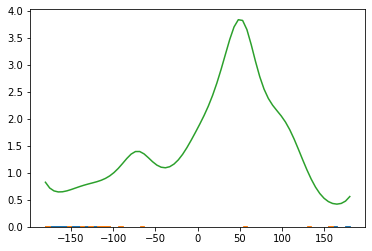

Neuron:  34


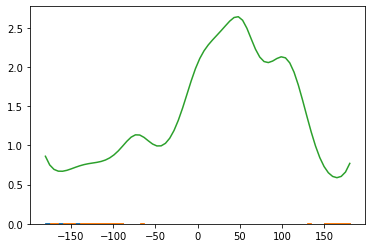

Neuron:  35


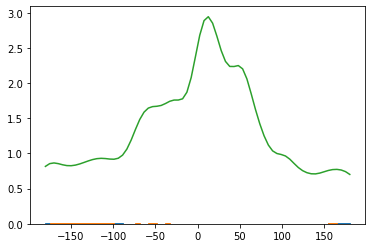

Neuron:  36


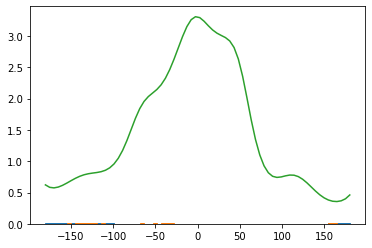

Neuron:  37


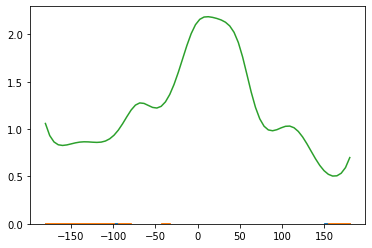

Neuron:  38


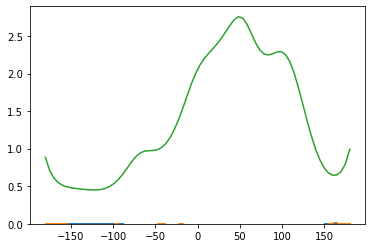

Neuron:  39


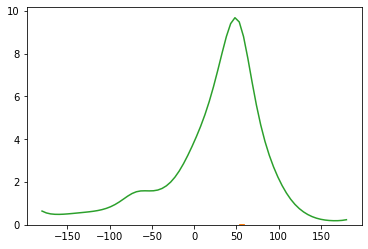

Neuron:  40


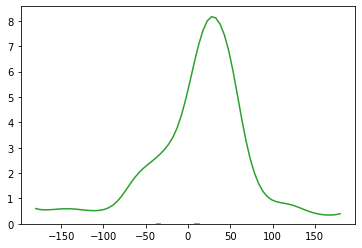

Neuron:  41


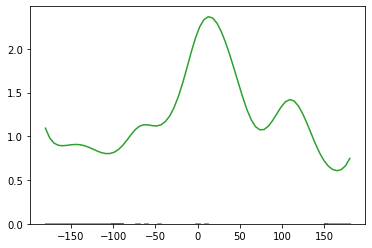

Neuron:  42


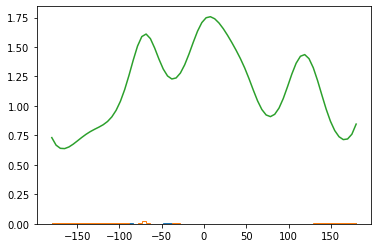

Neuron:  43


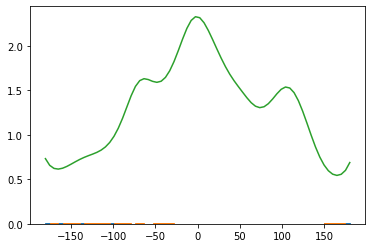

Neuron:  44


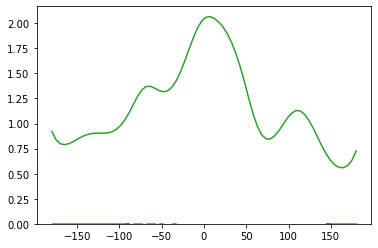

Neuron:  45


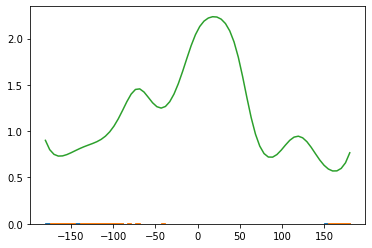

Neuron:  46


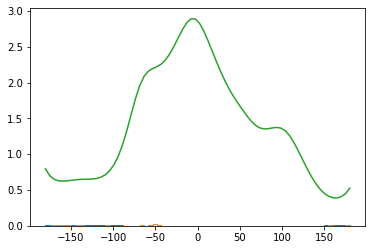

Neuron:  47


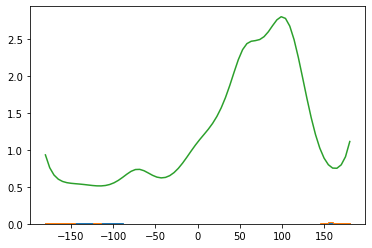

Neuron:  48


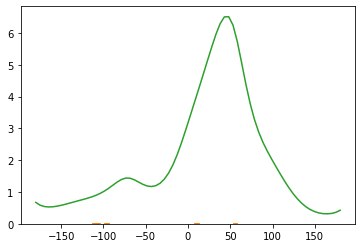

Neuron:  49


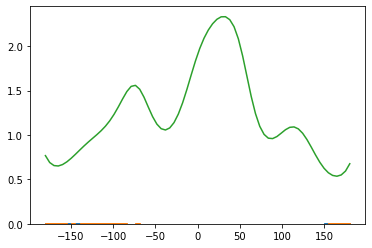

Neuron:  50


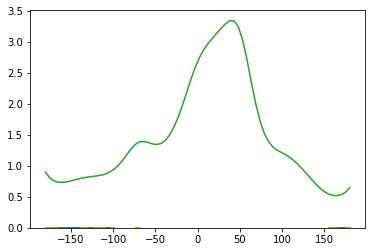

In [ ]:
for neuron_num in range(51):
  print("Neuron: ", neuron_num)
  make_direction_plot(0,neuron_num)

#Part 3: Clusters identifying neuron’s firing patterns

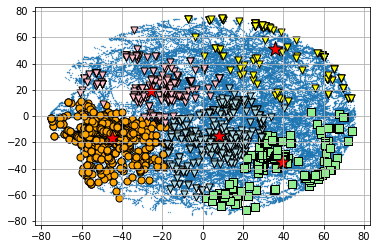

array([[ 39.32893303, -35.20232707],
       [-45.02628101, -16.55306823],
       [  8.10604104, -15.00179343],
       [-25.34285953,  19.26318128],
       [ 36.01594762,  51.3744759 ]])

In [ ]:
from sklearn.cluster import KMeans

def clustering(expt_no, neuron_no):
  position = str_dict["Position"]
  position_0 = position[expt_no]

  position_x = [i[0] for i in position_0]
  position_y = [i[1] for i in position_0]

  time = str_dict["Time"]
  time_0 = time[expt_no]

  uid = str_dict["UID"]
  activation_times_0 = uid[expt_no]['ST'][neuron_no]

  start_clip_index = 0
  end_clip_index = len(activation_times_0)-1
  while (activation_times_0[start_clip_index] < time_0[0]):
    start_clip_index +=1
  while (activation_times_0[end_clip_index] > time_0 [-1] ):
    end_clip_index -=1

  activation_times_0 = activation_times_0[start_clip_index : end_clip_index+1]
  active_arr_index = 0
  time_index = 1
  position_x_spike = []
  position_y_spike = []
  while time_index < len(time_0):
    if (time_0[time_index-1] <= activation_times_0[active_arr_index] <= time_0[time_index]):
      position_x_spike.append((position_0[time_index-1][0] + position_0[time_index][0])/2.0)
      position_y_spike.append((position_0[time_index-1][1] + position_0[time_index][1])/2.0)
      active_arr_index+=1
      if (active_arr_index == len(activation_times_0)):
        break
    else:
      time_index +=1


  X = list(zip(position_x_spike, position_y_spike))
  km = KMeans(
    n_clusters=5, init='random',
    n_init=10, max_iter=300, 
    tol=1e-04, random_state=0
    )
  y_km = km.fit_predict(X)

  plt.scatter(position_x, position_y, s = 0.1)
  plt.scatter(position_x_spike, position_y_spike, c="red", s=0.4)

  
  plt.scatter(
      np.array(position_x_spike)[np.array(y_km==0)], np.array(position_y_spike)[np.array(y_km==0)],
      s=50, c='lightgreen',
      marker='s', edgecolor='black',
      label='cluster 1'
  )

  plt.scatter(
      np.array(position_x_spike)[np.array(y_km==1)], np.array(position_y_spike)[np.array(y_km==1)],
      s=50, c='orange',
      marker='o', edgecolor='black',
      label='cluster 2'
  )

  plt.scatter(
      np.array(position_x_spike)[np.array(y_km==2)], np.array(position_y_spike)[np.array(y_km==2)],
      s=50, c='lightblue',
      marker='v', edgecolor='black',
      label='cluster 3'
  )

  plt.scatter(
      np.array(position_x_spike)[np.array(y_km==3)], np.array(position_y_spike)[np.array(y_km==3)],
      s=50, c='pink',
      marker='v', edgecolor='black',
      label='cluster 4'
  )
    
  plt.scatter(
      np.array(position_x_spike)[np.array(y_km==4)], np.array(position_y_spike)[np.array(y_km==4)],
      s=50, c='yellow',
      marker='v', edgecolor='black',
      label='cluster 5'
  )

  #plot the centroids
  plt.scatter(
      km.cluster_centers_[:, 0], km.cluster_centers_[:, 1],
      s=250, marker='*',
      c='red', edgecolor='black',
      label='centroids'
  )

  plt.grid()
  plt.show() 
  return km.cluster_centers_

clustering(0,0)


Neuron:  0


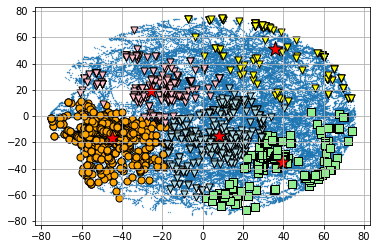

Neuron:  1


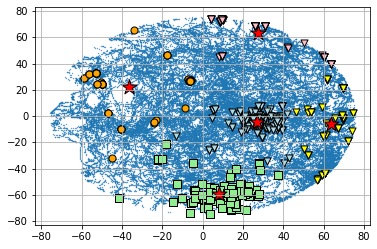

Neuron:  2


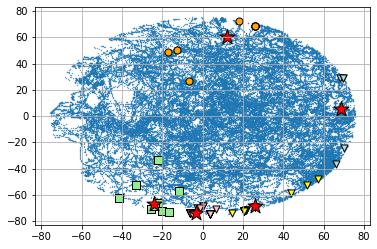

Neuron:  3


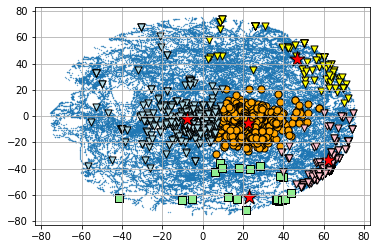

Neuron:  4


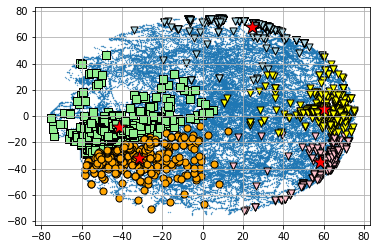

Neuron:  5


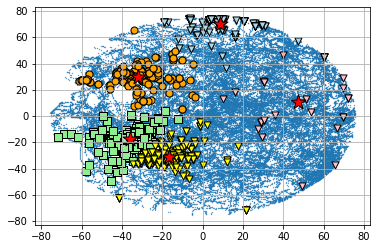

Neuron:  6


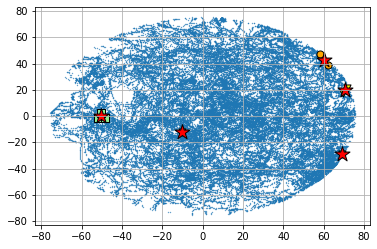

Neuron:  7


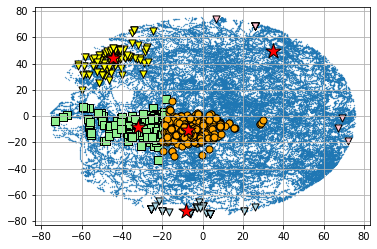

Neuron:  8


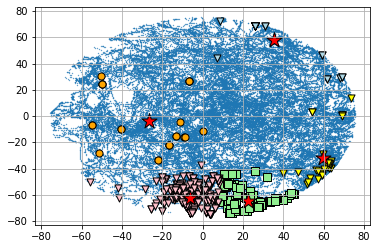

Neuron:  9


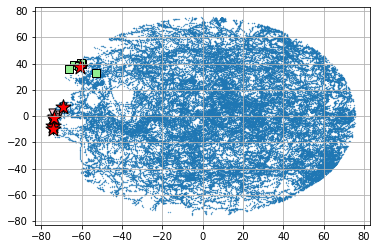

Neuron:  10


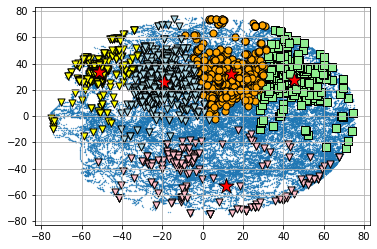

Neuron:  11


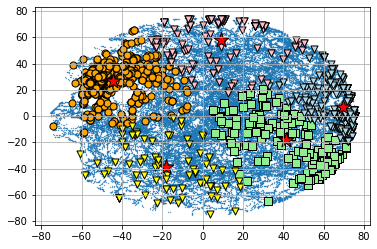

Neuron:  12


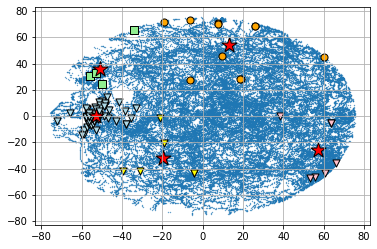

Neuron:  13


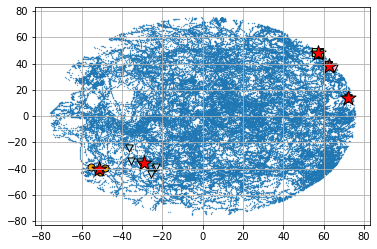

Neuron:  14


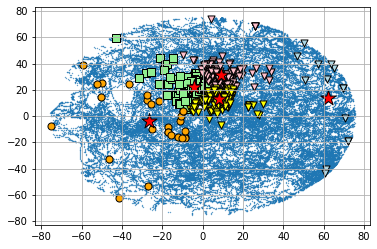

Neuron:  15


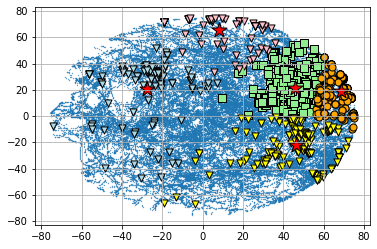

Neuron:  16


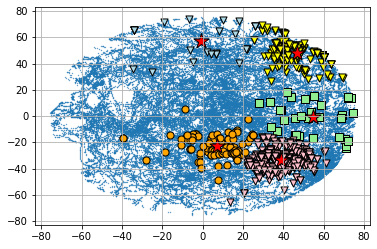

Neuron:  17


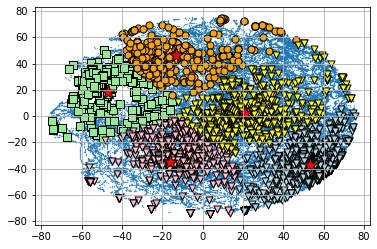

Neuron:  18


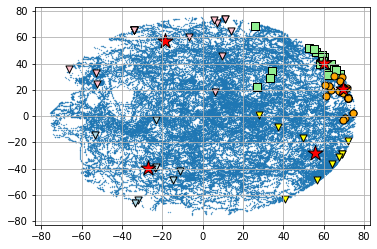

Neuron:  19


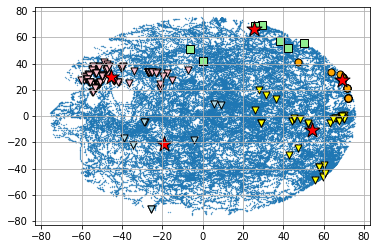

Neuron:  20


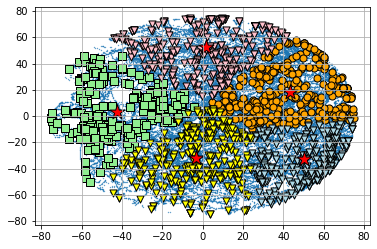

Neuron:  21


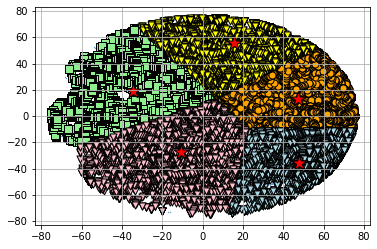

Neuron:  22


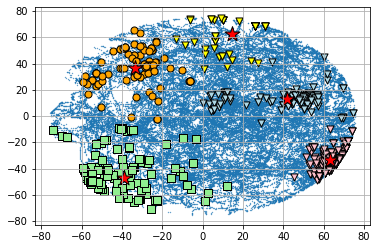

Neuron:  23


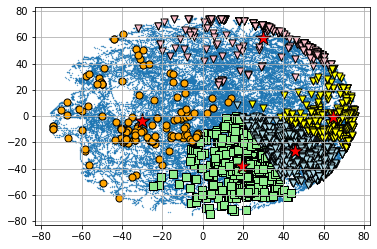

Neuron:  24


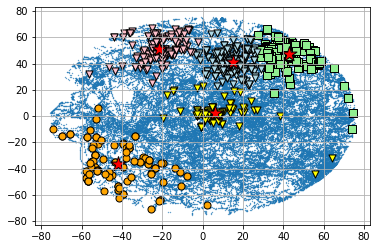

Neuron:  25


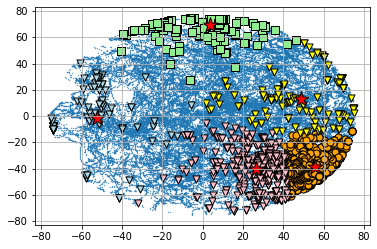

Neuron:  26


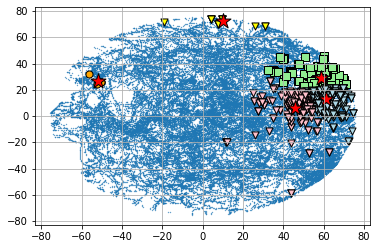

Neuron:  27


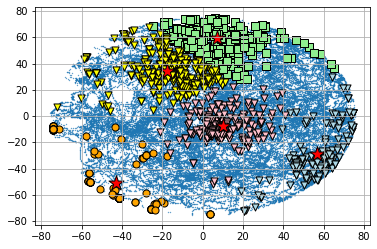

Neuron:  28


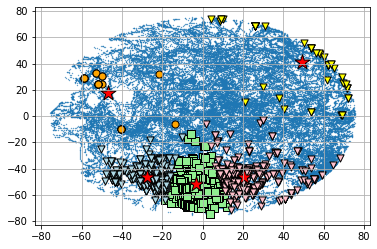

Neuron:  29


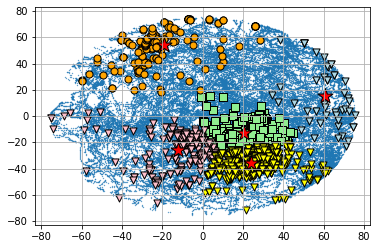

Neuron:  30


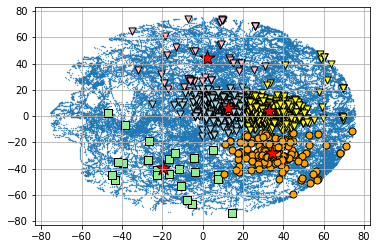

Neuron:  31


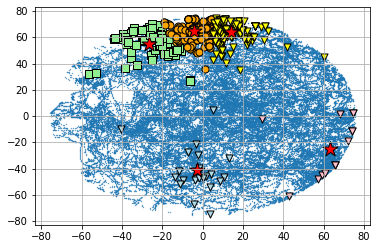

Neuron:  32


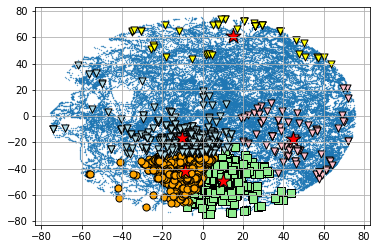

Neuron:  33


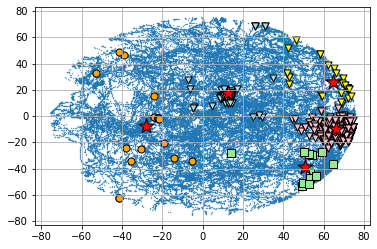

Neuron:  34


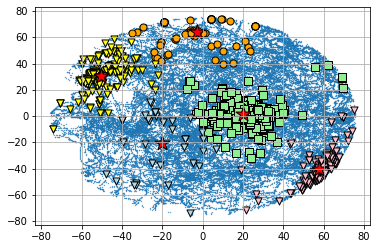

Neuron:  35


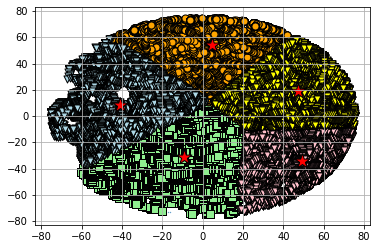

Neuron:  36


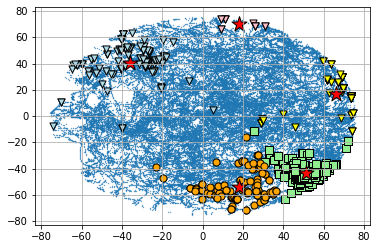

Neuron:  37


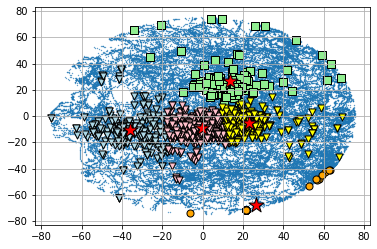

Neuron:  38


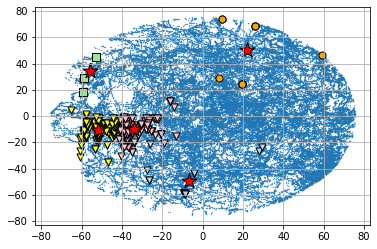

Neuron:  39


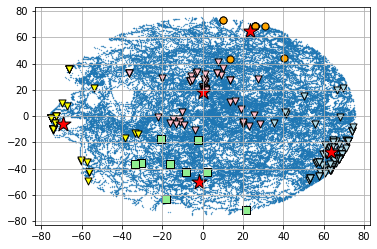

Neuron:  40


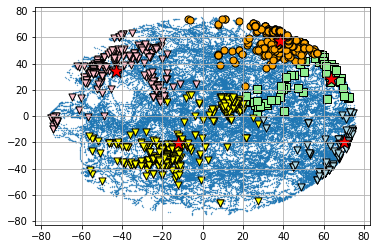

Neuron:  41


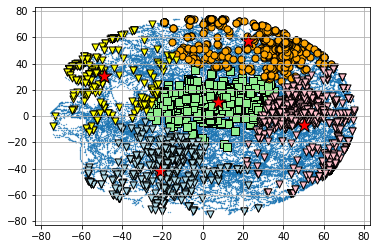

Neuron:  42


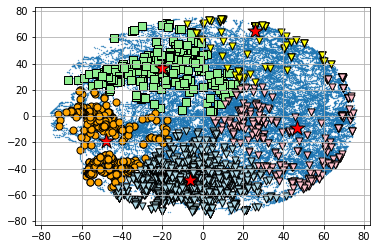

Neuron:  43


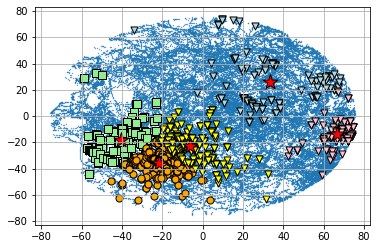

Neuron:  44


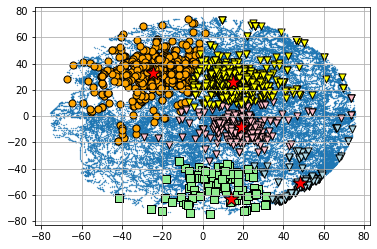

Neuron:  45


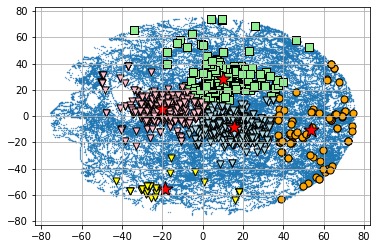

Neuron:  46


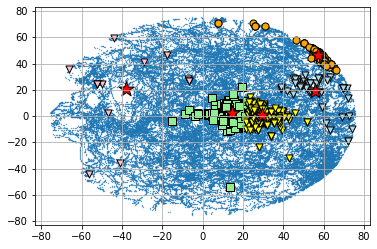

Neuron:  47


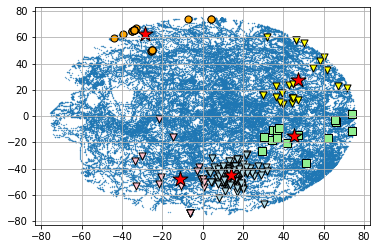

Neuron:  48


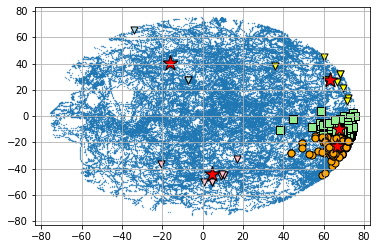

Neuron:  49


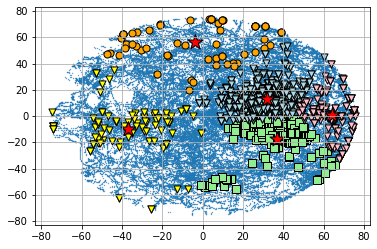

Neuron:  50


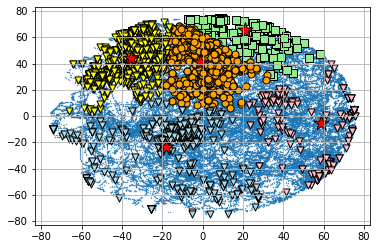

In [ ]:
loc_master = np.zeros((51,5,2))

for neuron_num in range(51):
  print("Neuron: ",neuron_num)
  loc_master[neuron_num] = clustering(0,neuron_num)

#Part 4: Grouping neurons that fire together for the same stimuli

In [ ]:
print (loc_master)
groupings = []
for i in range(51):
  for j in range(5):
    for k in range(i+1,51):
      for l in range(5):
        dist = np.linalg.norm(loc_master[i,j]-loc_master[k,l])
        groupings.append([dist,i,j,k,l,loc_master[i,j],loc_master[k,l]])

[[[ 39.32893303 -35.20232707]
  [-45.02628101 -16.55306823]
  [  8.10604104 -15.00179343]
  [-25.34285953  19.26318128]
  [ 36.01594762  51.3744759 ]]

 [[  8.34523419 -59.01804823]
  [-36.4318776   22.00695381]
  [ 26.96284806  -4.29614553]
  [ 27.62775823  63.5559818 ]
  [ 63.59754304  -6.31869024]]

 [[-24.01485717 -67.29068215]
  [ 12.25685659  60.12612148]
  [ 68.55915224   5.27236983]
  [ -3.15756031 -73.6648532 ]
  [ 25.72421453 -68.88859236]]

 [[ 22.84494414 -61.99655337]
  [ 22.72511252  -5.31783296]
  [ -7.78825402  -1.90315136]
  [ 62.17658127 -33.82600505]
  [ 46.84239106  43.75628809]]

 [[-41.62463798  -8.64666897]
  [-31.55791193 -31.59900921]
  [ 24.34288384  68.05595003]
  [ 58.37233162 -34.76777212]
  [ 60.09893872   5.76115725]]

 [[-35.87525964 -17.37400829]
  [-32.1717452   29.76289423]
  [  8.73581066  70.14024481]
  [ 47.11563402  10.36364172]
  [-16.46620077 -31.2293026 ]]

 [[-50.1629427   -0.16204578]
  [ 60.13292891  43.07997869]
  [ 69.12698501 -29.18933708

In [ ]:
all_sort = sorted(groupings, key= lambda x: x[0])

In [ ]:
all_sort[:100]

[[0.2871801811933879,
  8,
  1,
  14,
  1,
  array([-26.62779459,  -3.76336121]),
  array([-26.7586542 ,  -4.01899418])],
 [0.41989038983668014,
  3,
  1,
  37,
  4,
  array([22.72511252, -5.31783296]),
  array([23.01888185, -5.6178455 ])],
 [0.49668298915209913,
  40,
  0,
  48,
  4,
  array([63.60166334, 28.12106957]),
  array([63.3572537 , 27.68868326])],
 [0.6201490267062834,
  38,
  2,
  42,
  2,
  array([ -6.7152626 , -49.49730732]),
  array([ -6.49430079, -48.91785871])],
 [0.8114499872324517,
  19,
  4,
  45,
  1,
  array([ 54.35423948, -10.31332204]),
  array([ 53.65176175, -10.71949457])],
 [1.1263556273675916,
  18,
  4,
  27,
  2,
  array([ 55.50764552, -28.16129252]),
  array([ 56.57524543, -28.52032935])],
 [1.1980120264314174,
  17,
  0,
  28,
  1,
  array([-46.66059886,  18.62215613]),
  array([-47.09632945,  17.50619391])],
 [1.2240422425099435,
  21,
  1,
  25,
  4,
  array([47.42052575, 13.20256339]),
  array([48.5695433, 12.7806178])],
 [1.2614114013896367,
  22,
  

In [ ]:
adj_dist = np.zeros((51,51))
adj_xcent = np.zeros((51,51))
adj_ycent = np.zeros((51,51))

points = []
neurons = []

for a in range(100):
  dist,i,j,k,l,c1,c2 = all_sort[a]

  xc = 0.5*(c1[0]+c2[0])
  yc = 0.5*(c1[1]+c2[1])
  adj_dist[i,k] = dist
  adj_xcent[i,k] = xc
  adj_ycent[i,k] = yc

  points.append([xc,yc])
  neurons.append([i,k])

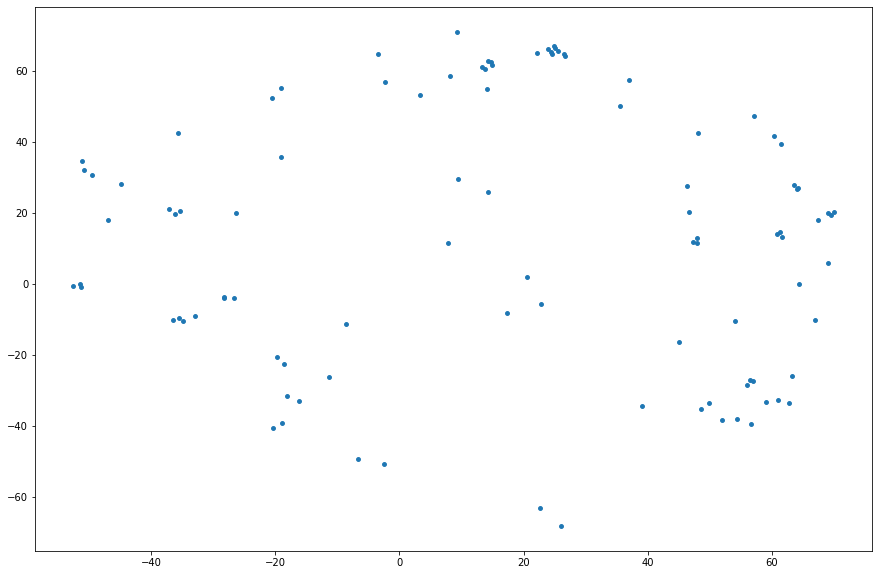

In [ ]:
points_x = [i[0] for i in points]
points_y = [i[1] for i in points]
plt.scatter(points_x, points_y, s=15.0)
# for i, txt in enumerate(neurons):
#     plt.text(points_x[i]+.03, points_y[i]+.03, txt, fontsize=30)

plt.gcf().set_size_inches(15, 10)
plt.show()

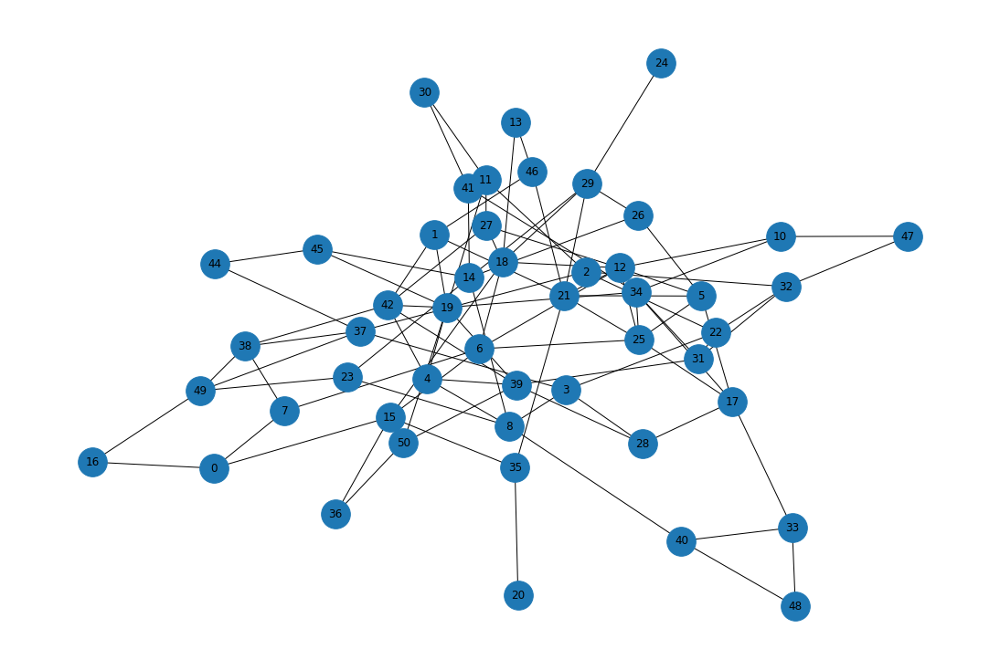

In [ ]:
import networkx as nx
import pylab as plt

G=nx.Graph()
# Add nodes and edges

for i,j in neurons:
  x = str(i)
  y = str(j)
  G.add_edge(x,y)

plt.gcf().set_size_inches(15, 10)
nx.draw(G, with_labels = True, node_size=1000)